<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2920 entries, 0 to 2919
Data columns (total 10 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   distance-to-solar-noon       2920 non-null   float64
 1   temperature                  2920 non-null   int64  
 2   wind-direction               2920 non-null   int64  
 3   wind-speed                   2920 non-null   float64
 4   sky-cover                    2920 non-null   int64  
 5   visibility                   2920 non-null   float64
 6   humidity                     2920 non-null   int64  
 7   average-wind-speed-(period)  2919 non-null   float64
 8   average-pressure-(period)    2920 non-null   float64
 9   power-generated              2920 non-null   int64  
dtypes: float64(5), int64(5)
memory usage: 228.3 KB
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.03424657534246575
0.0
0.0
9.0


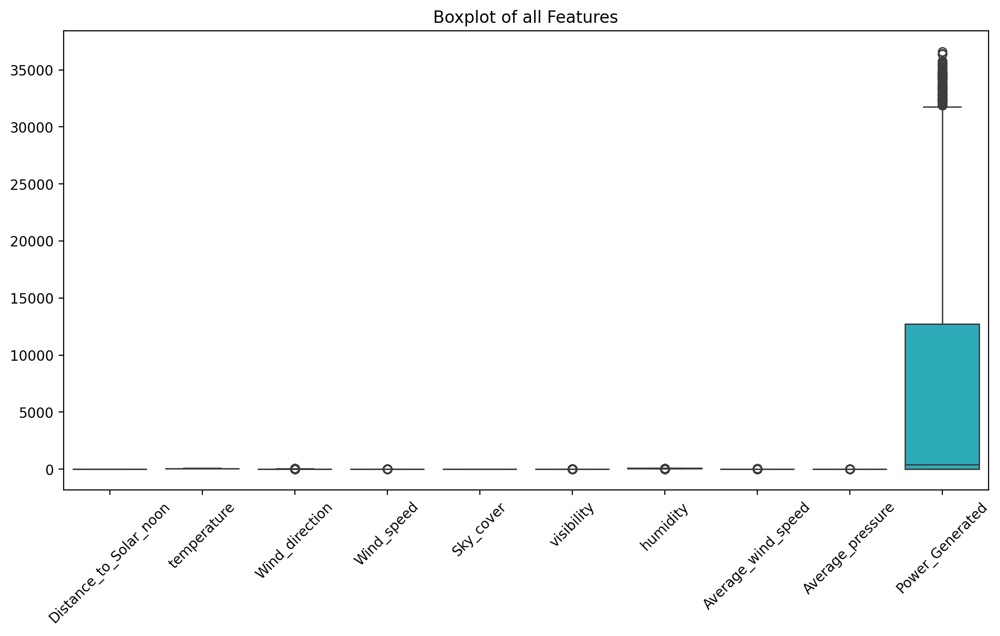

<Figure size 2400x1600 with 0 Axes>

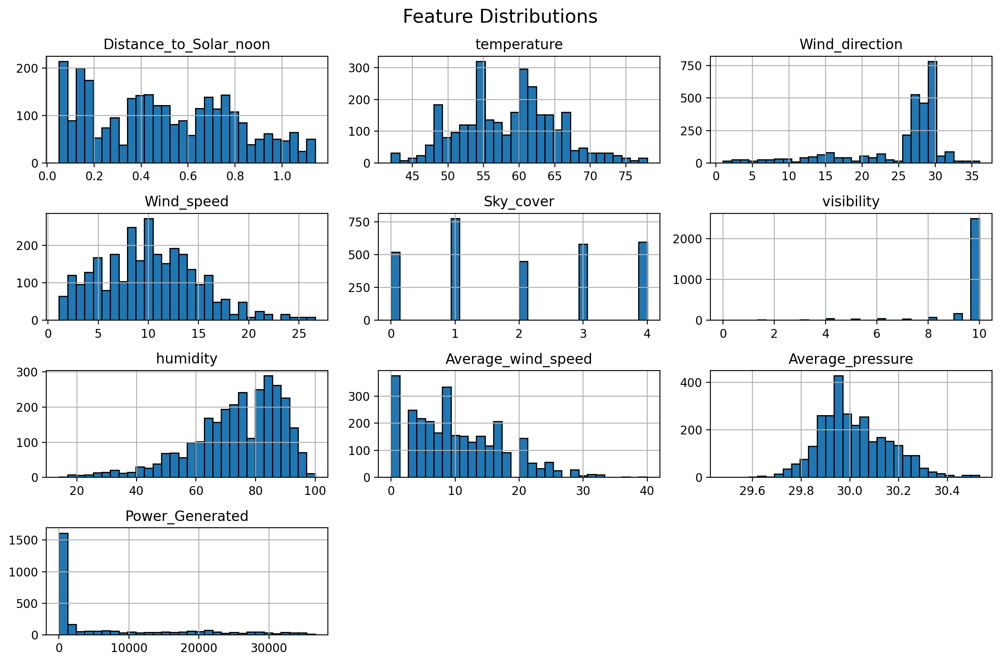

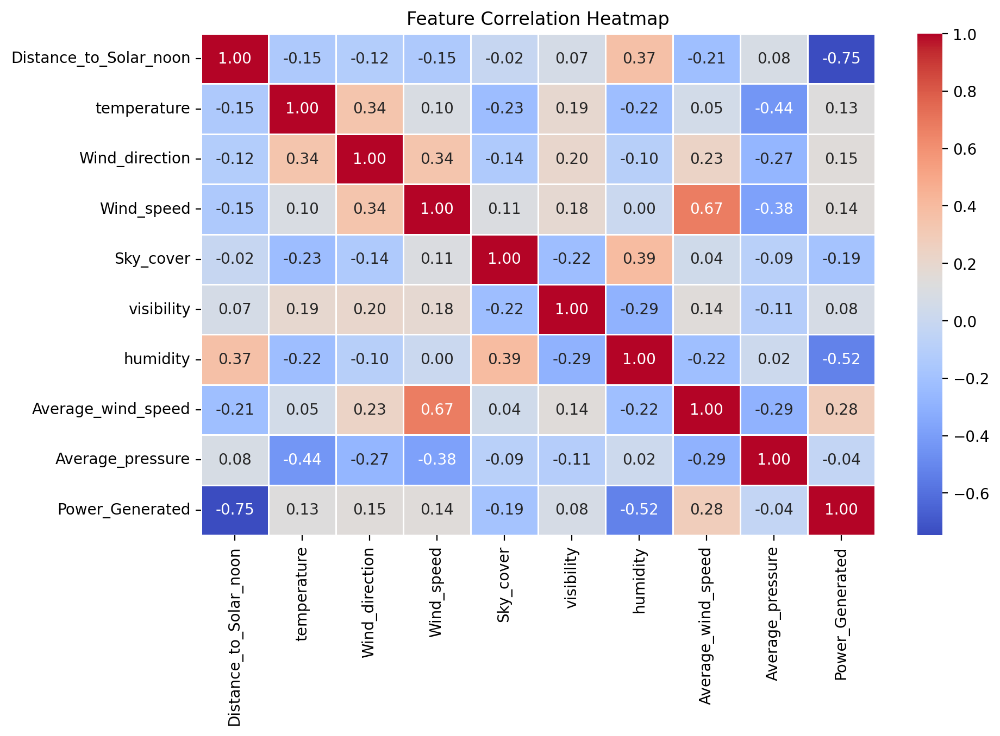

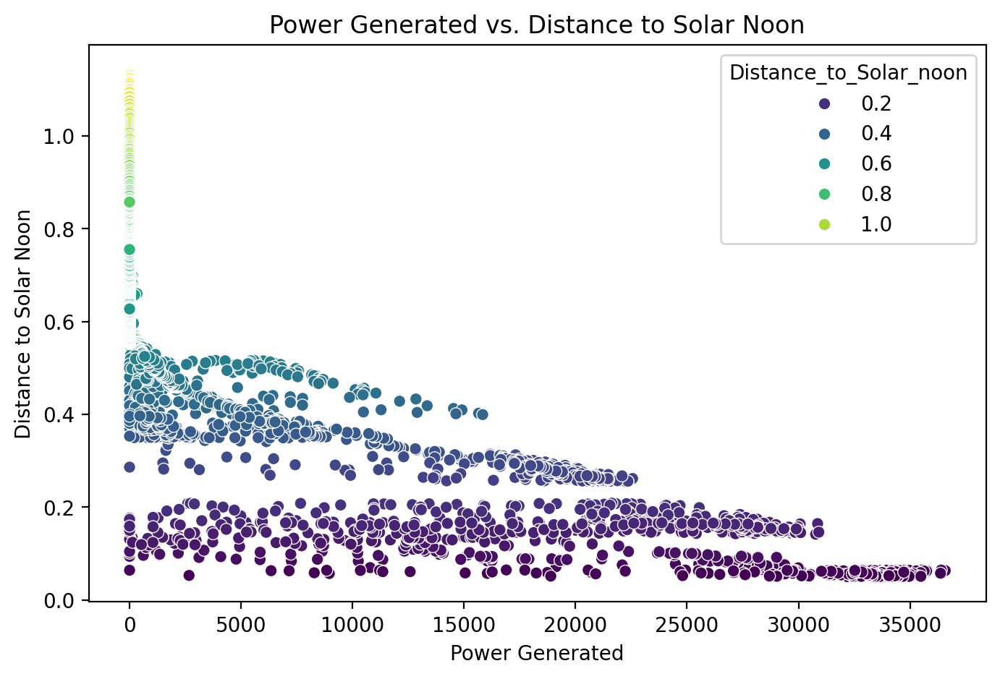

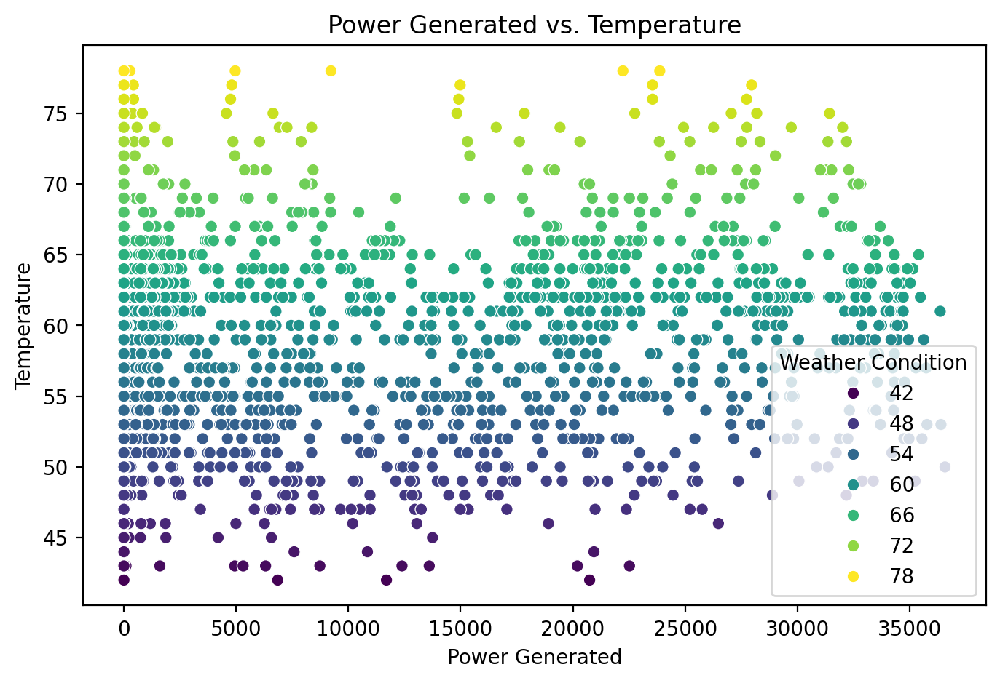

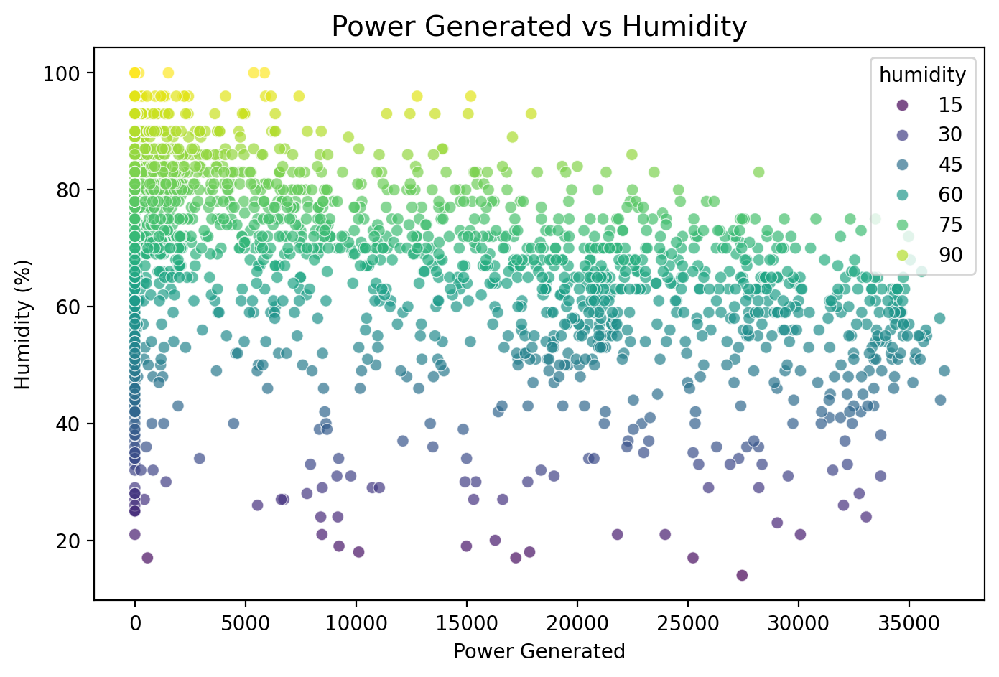

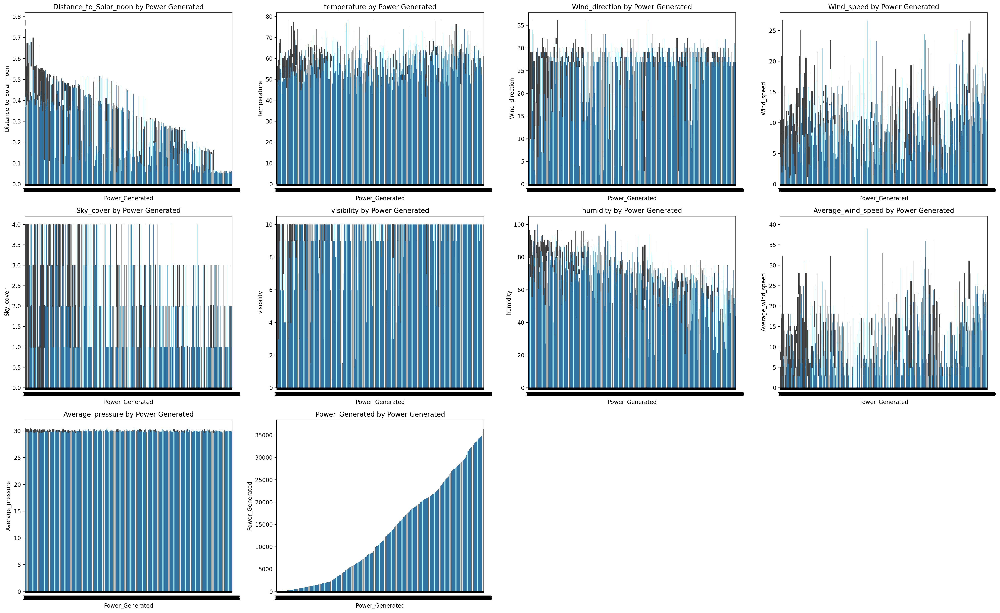

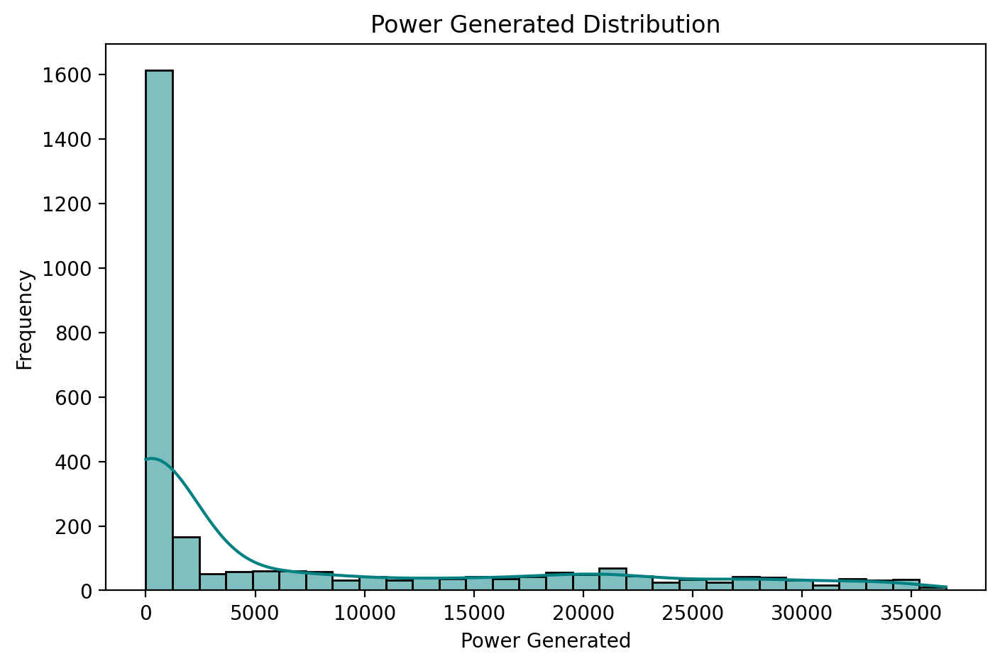

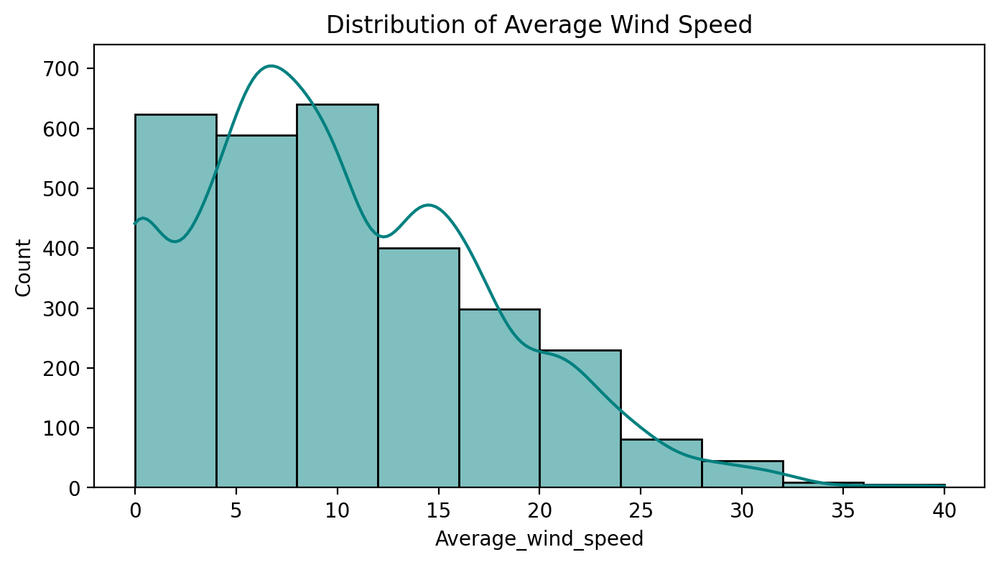

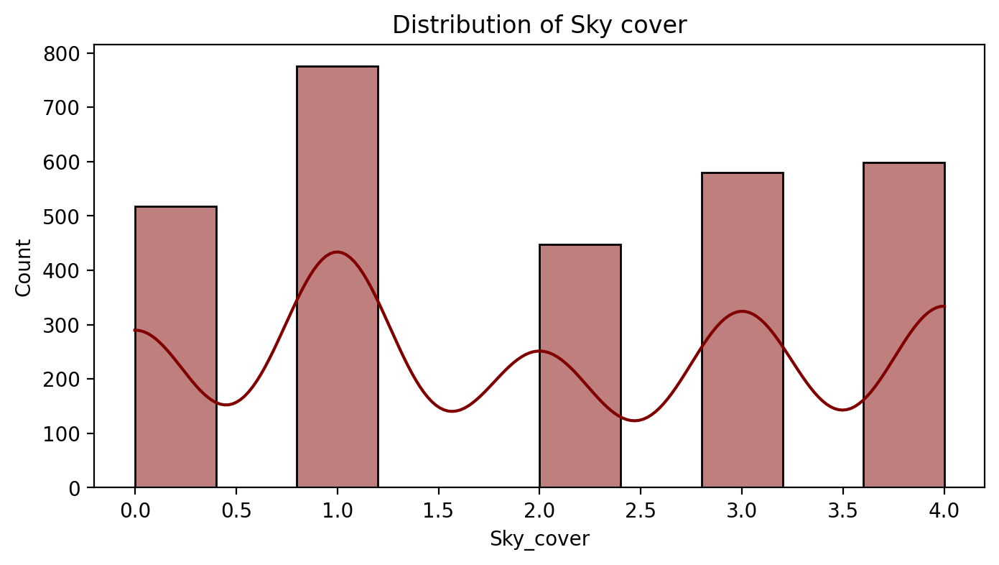

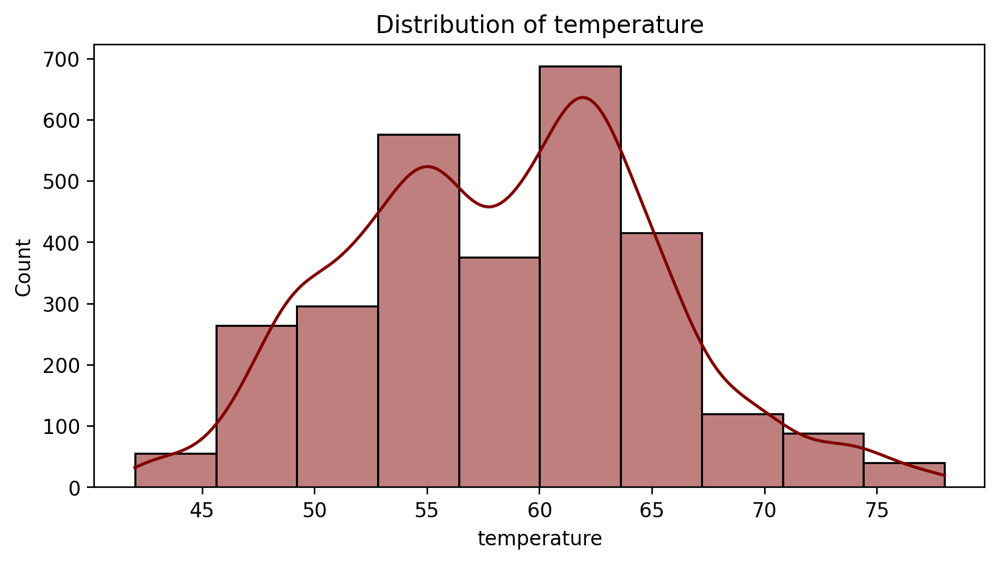

In [1]:
# -*- coding: utf-8 -*-
"""SOLAR PANEL.ipynb

Automatically generated by Colab.

Original file is located at
    https://colab.research.google.com/drive/1UOGD-fAs6mE_C5nGeS1X838fEcyEz_fy
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 200
import warnings
warnings.filterwarnings("ignore")

# Load the dataset
data = pd.read_csv(r"C:\Users\Shruti\Downloads\solarpowergeneration.csv")
data

data.info()

"""## 📝 Initial Observations:

1. The dataset contains 2920 entries and 10 columns.

2. The target variable is "Power_Generated", which is numeric and continuous

4. The feature "Distance_to_Solar_noon" is continuous and appears to be inversely related to power generation — closer to noon, higher power output.

4. Features like "humidity", "Average_wind_speed", and "Average_pressure" vary across entries and are likely to influence the target.


"""

#Summary Statistics
data.describe()

data.dtypes

len(data)

data.columns

#Clean Column Names
data.rename(columns={'distance-to-solar-noon':'Distance to Solar noon','wind-direction':'Wind direction','wind-speed':'Wind speed',
                     'sky-cover':'Sky cover','average-wind-speed-(period)':'Average wind speed',
                     'average-pressure-(period)':'Average pressure','power-generated':'Power Generated'},inplace=True)

#replace spaces with underscores
data.columns = data.columns.str.replace(" ", "_")

data.head()

#Handle Missing Values
data.isna().sum()

#Calculate the percentage of missig values in each column.
for i in data.isna().sum():
    print((i/len(data))*100)

data['Average_wind_speed'].median()

#Fill missing values in 'Average_wind_speed' with median
average_wind_speed_median = data['Average_wind_speed'].median()
print(average_wind_speed_median)

data['Average_wind_speed'].fillna(average_wind_speed_median, inplace=True)

data.isna().sum()

#Check for Duplicates
data.duplicated().sum()

"""# Outlier detection"""

data.describe()

#Outlier Detection using Boxplots
plt.figure(figsize=(12, 6))
sns.boxplot(data=data)
plt.xticks(rotation=45)
plt.title("Boxplot of all Features")
plt.show()

#Visualize distributions using histograms
plt.figure(figsize=(12, 8))
data.hist(figsize=(12, 8), bins=30, edgecolor="black")
plt.suptitle("Feature Distributions", fontsize=16)
plt.tight_layout()
plt.show()

"""# Correlation Matrix and Heatmap"""

#Compute correlation matrix

correlation_matrix = data.corr()

#Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

"""# Scatter Plots – Relationships"""

#Power Generated vs Distance to Solar Noon

# Create the scatter plot
plt.figure(figsize=(8, 5))
scatter = sns.scatterplot(x='Power_Generated',y='Distance_to_Solar_noon',hue='Distance_to_Solar_noon',palette='viridis',data=data)
plt.title('Power Generated vs. Distance to Solar Noon')
plt.xlabel('Power Generated')
plt.ylabel('Distance to Solar Noon')
plt.show()

#Power Generated vs Temperature

plt.figure(figsize=(8, 5))
scatter_plot = sns.scatterplot(x='Power_Generated',y='temperature', hue ='temperature',palette='viridis',data=data)
plt.title('Power Generated vs. Temperature')
plt.xlabel('Power Generated')
plt.ylabel('Temperature')
plt.legend(title='Weather Condition')  # Adds a legend with a title
plt.show()

#Humidity vs Power Generated

plt.figure(figsize=(8, 5))
sns.scatterplot( x='Power_Generated', y='humidity', data=data, palette='viridis', hue='humidity', alpha=0.7 )
plt.title('Power Generated vs Humidity', fontsize=14)
plt.xlabel('Power Generated')
plt.ylabel('Humidity (%)')
plt.show()

columns = data.columns
columns

#Create barplots with Power generated

plt.figure(figsize=(25, 20))
for i, col in enumerate(columns, 1):
    plt.subplot(4, 4, i)
    sns.barplot(data=data, x='Power_Generated', y=col)
    plt.title(f'{col} by Power Generated')
plt.tight_layout()

# Distribution of Power Generated
plt.figure(figsize=(8, 5))
sns.histplot(data["Power_Generated"], bins=30, kde=True, color="Teal")
plt.title("Power Generated Distribution")
plt.xlabel("Power Generated")
plt.ylabel("Frequency")
plt.show()

# Distribution of Average_wind_speed

plt.figure(figsize=(8, 4))
sns.histplot(data["Average_wind_speed"], bins=10, kde=True, color="Teal")
plt.title("Distribution of Average Wind Speed")
plt.show()

# Distribution of Sky cover

plt.figure(figsize=(8, 4))
sns.histplot(data["Sky_cover"], bins=10, kde=True, color="maroon")
plt.title("Distribution of Sky cover")
plt.show()

# Distribution of temperature

plt.figure(figsize=(8, 4))
sns.histplot(data["temperature"], bins=10, kde=True, color="maroon")
plt.title("Distribution of temperature")
plt.show()



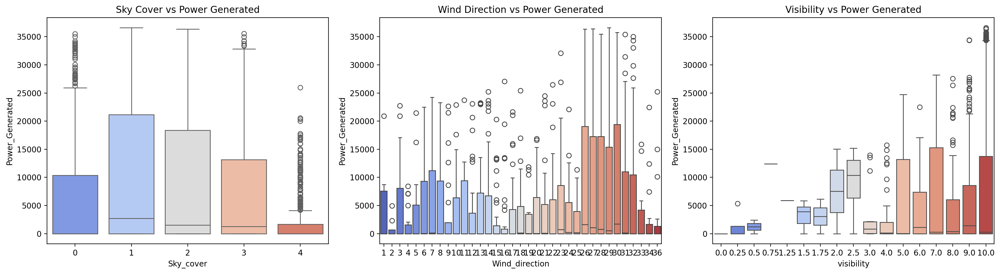

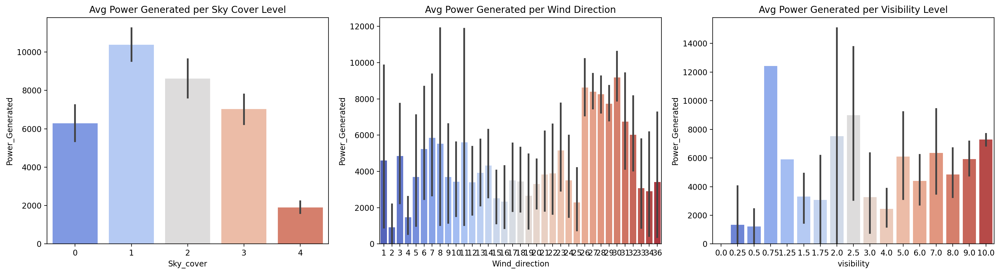

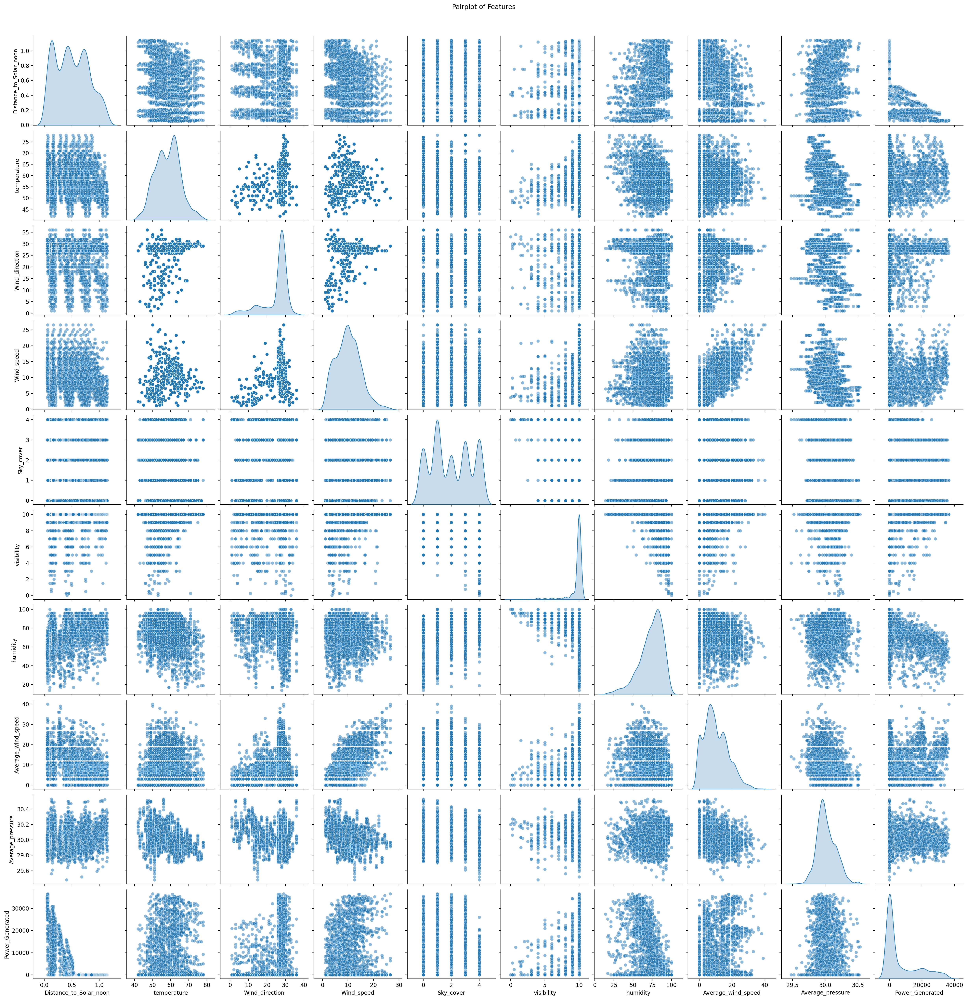

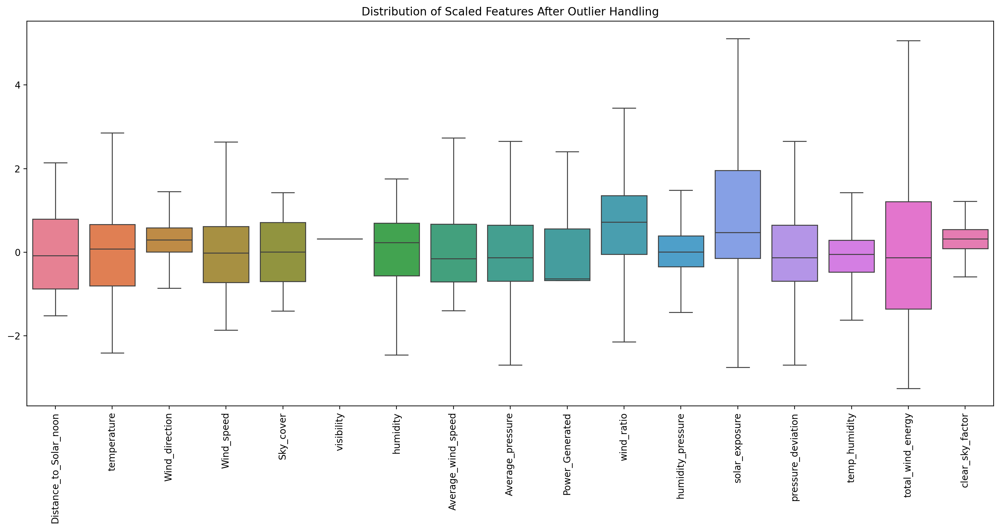

In [2]:
"""# Categorical Feature Analysis"""

# Categorical Feature Analysis
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Sky Cover vs Power Generated--
sns.boxplot(x="Sky_cover", y="Power_Generated", data=data, ax=axes[0], palette="coolwarm")
axes[0].set_title("Sky Cover vs Power Generated")

# Wind Direction vs Power Generated
sns.boxplot(x="Wind_direction", y="Power_Generated", data=data, ax=axes[1], palette="coolwarm")
axes[1].set_title("Wind Direction vs Power Generated")

# Visibility vs Power Generated
sns.boxplot(x="visibility", y="Power_Generated", data=data, ax=axes[2], palette="coolwarm")
axes[2].set_title("Visibility vs Power Generated")

plt.tight_layout()
plt.show()

#Create Bar Charts (Mean Power Generated per Category)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Sky Cover
sns.barplot(x="Sky_cover", y="Power_Generated", data=data, ax=axes[0], palette="coolwarm", estimator=np.mean)
axes[0].set_title("Avg Power Generated per Sky Cover Level")

# Wind Direction (Binned)
sns.barplot(x="Wind_direction", y="Power_Generated", data=data, ax=axes[1], palette="coolwarm", estimator=np.mean)
axes[1].set_title("Avg Power Generated per Wind Direction")

# Visibility (Binned)
sns.barplot(x="visibility", y="Power_Generated", data=data, ax=axes[2], palette="coolwarm", estimator=np.mean)
axes[2].set_title("Avg Power Generated per Visibility Level")

plt.tight_layout()
plt.show()

#Pairplot
sns.pairplot(data, diag_kind="kde", plot_kws={"alpha": 0.5})
plt.suptitle("Pairplot of Features", y=1.02)
plt.show()

"""# Feature Importance Analysis"""

from sklearn.preprocessing import StandardScaler

data

# Scaling the Data for avoiding uniqueness

scaler = StandardScaler()

scaled_data = scaler.fit_transform(data)

scaled_df = pd.DataFrame(scaled_data, columns=data.columns)
scaled_df

scaled_df['Power_Generated'].nunique()

# Create new features
scaled_df['wind_ratio'] = scaled_df['Wind_speed'] / (scaled_df['Average_wind_speed'] + 1e-3)  # Avoid division by zero
scaled_df['humidity_pressure'] = scaled_df['humidity'] * scaled_df['Average_pressure']
scaled_df['solar_exposure'] = (1 - scaled_df['Distance_to_Solar_noon']) * (1 - scaled_df['Sky_cover'])
scaled_df['pressure_deviation'] = scaled_df['Average_pressure'] - scaled_df['Average_pressure'].mean()
scaled_df['temp_humidity'] = scaled_df['temperature'] * scaled_df['humidity']
scaled_df['total_wind_energy'] = scaled_df['Wind_speed'] + scaled_df['Average_wind_speed']
scaled_df['clear_sky_factor'] = scaled_df['visibility'] * (1 - scaled_df['Sky_cover'])

# Handle any NaN values from division by zero
scaled_df = scaled_df.fillna(0)

scaled_df

# Handle Outliers

# Define function to remove outliers using IQR method
def remove_outliers(df, columns, n_std=1.5):
    df_clean = df.copy()
    for col in columns:
        # Calculate Q1, Q3 and IQR
        Q1 = df_clean[col].quantile(0.25)
        Q3 = df_clean[col].quantile(0.75)
        IQR = Q3 - Q1

        # Define outlier bounds
        lower_bound = Q1 - n_std * IQR
        upper_bound = Q3 + n_std * IQR

        # Replace outliers with bounds
        df_clean.loc[df_clean[col] < lower_bound, col] = lower_bound
        df_clean.loc[df_clean[col] > upper_bound, col] = upper_bound

    return df_clean

# Get numeric columns
numeric_cols = scaled_df.select_dtypes(include=['float64', 'int64']).columns

# Remove outliers from numeric columns
scaled_df_no_outliers = remove_outliers(scaled_df, numeric_cols)

# Verify outlier removal with boxplot
plt.figure(figsize=(15,8))
sns.boxplot(data=scaled_df_no_outliers)
plt.xticks(rotation=90)
plt.title('Distribution of Scaled Features After Outlier Handling')
plt.tight_layout()

# Update scaled_df with outlier handled version
scaled_df = scaled_df_no_outliers

scaled_df_no_outliers

# Select important features based on correlation with Power Generated

# Calculate correlation with Power Generated
correlations = scaled_df.corr()['Power_Generated'].abs().sort_values(ascending=False)


Top correlations with Power_Generated:
Power_Generated           1.000000
Distance_to_Solar_noon    0.749567
solar_exposure            0.683083
humidity                  0.536943
Average_wind_speed        0.273702
total_wind_energy         0.224704
Sky_cover                 0.187133
Wind_direction            0.150843
Wind_speed                0.139647
temperature               0.133606
Name: Power_Generated, dtype: float64

Selected features shape: (2920, 10)
Top 15 Most Important Features:
                   Feature  Importance (%)
0   Distance_to_Solar_noon       79.682047
11          solar_exposure       11.366273
6                 humidity        1.794125
3               Wind_speed        1.027023
2           Wind_direction        0.840373
14       total_wind_energy        0.750738
9               wind_ratio        0.687792
13           temp_humidity        0.641691
1              temperature        0.614355
10       humidity_pressure        0.587985
7       Average_wind_speed     

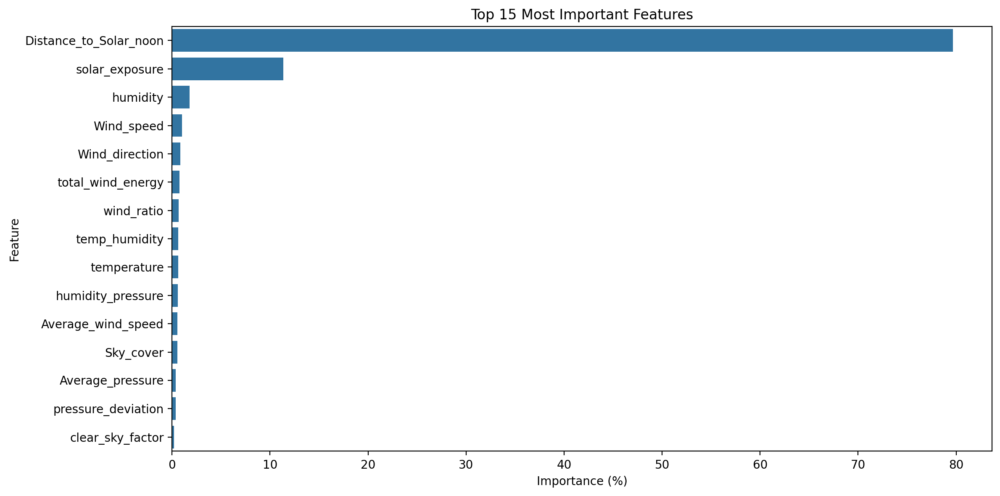


Selected important features shape: (2920, 11)


,Distance_to_Solar_noon,solar_exposure,humidity,Wind_speed,Wind_direction,total_wind_energy,wind_ratio,temp_humidity,temperature,humidity_pressure,Power_Generated
0,1.196765,-0.473803,0.098597,-0.536861,0.440639,-0.830116,1.836957,0.151808,1.539688,-0.137331,0
1,0.420310,1.395873,0.231271,-0.536861,0.440639,-1.243391,0.760932,0.356084,1.539688,-0.273261,0
2,-0.356146,3.265549,-0.233088,-0.536861,0.440639,-1.932183,0.385033,-0.358883,1.539688,0.209741,5418
3,-1.132602,5.110133,-2.455375,-0.536861,0.440639,-1.932183,0.385033,-1.619808,1.539688,1.484993,25477
4,-1.469066,5.110133,-2.455375,-0.536861,0.440639,-1.518908,0.547232,-1.619808,1.539688,1.484993,30069
...,...,...,...,...,...,...,...,...,...,...,...
2915,-1.130442,-0.906351,0.098597,0.786176,0.296005,0.768437,-2.142940,0.065320,0.662498,-0.060944,6995
2916,-1.474208,4.205201,-0.498436,0.786176,0.296005,1.457229,1.169813,-0.330213,0.662498,0.378300,29490
2917,-0.700735,1.685882,-0.365762,0.786176,0.296005,2.283779,0.524606,-0.242317,0.662498,0.354887,17257
2918,0.072738,0.919164,0.496618,0.786176,0.296005,1.732746,0.829676,0.329009,0.662498,-0.516831,677


In [3]:

# Print top correlations
print("Top correlations with Power_Generated:")
print(correlations[:10])

# Select features that have meaningful correlation with Power Generated
important_features = [
    'Distance_to_Solar_noon',
    'solar_exposure',
    'Sky_cover',
    'humidity_pressure',
    'wind_ratio',
    'Wind_speed',
    'Wind_direction',
    'total_wind_energy',
    'temperature',
    'Power_Generated'           # Target variable
]

# Create new dataframe with selected features
selected_df = scaled_df[important_features]

print("\nSelected features shape:", selected_df.shape)
selected_df.head()

# Import required libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Prepare features (X) and target (y)
X = scaled_df.drop(columns=['Power_Generated'])  # Use scaled features
y = data['Power_Generated']  # Use original churn values from unscaled data

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Calculate and display feature importance in percentages
feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance (%)': rf_model.feature_importances_ * 100
})

# Sort features by importance
feature_importance = feature_importance.sort_values('Importance (%)', ascending=False)

# Display top features
print("Top 15 Most Important Features:")
print(feature_importance.head(15))

# Visualize feature importance
plt.figure(figsize=(12, 6))
sns.barplot(x='Importance (%)', y='Feature', data=feature_importance.head(15))
plt.title('Top 15 Most Important Features')
plt.tight_layout()
plt.show()

# Select top 10 most important features based on Random Forest
top_features = feature_importance['Feature'].head(10).tolist()

# Add target variable 'Power Generated' to the list of selected features
top_features.append('Power_Generated')

# Create new dataframe with selected important features
selected_f_df = scaled_df[top_features]

print("\nSelected important features shape:", selected_f_df.shape)
selected_f_df.head()

"""# Model Building"""

# Adding the Power Generated Column to the Scaled Dataset

selected_f_df['Power_Generated'] = data['Power_Generated']
selected_f_df



Gradient Boosting Regressor Performance:
Mean Absolute Error (MAE): 1763.47
Root Mean Squared Error (RMSE): 3405.31
R-squared (R²): 0.89
----------------------------------------
Random Forest Regressor Performance:
Mean Absolute Error (MAE): 1626.14
Root Mean Squared Error (RMSE): 3484.83
R-squared (R²): 0.88
----------------------------------------
Bagging Regressor Performance:
Mean Absolute Error (MAE): 1688.09
Root Mean Squared Error (RMSE): 3620.66
R-squared (R²): 0.88
----------------------------------------
AdaBoost Regressor Performance:
Mean Absolute Error (MAE): 4025.87
Root Mean Squared Error (RMSE): 4892.85
R-squared (R²): 0.77
----------------------------------------
Decision Tree Regressor Performance:
Mean Absolute Error (MAE): 2249.53
Root Mean Squared Error (RMSE): 4794.65
R-squared (R²): 0.78
----------------------------------------
K-Nearest Neighbors Regressor Performance:
Mean Absolute Error (MAE): 2590.04
Root Mean Squared Error (RMSE): 4750.86
R-squared (R²): 0.7

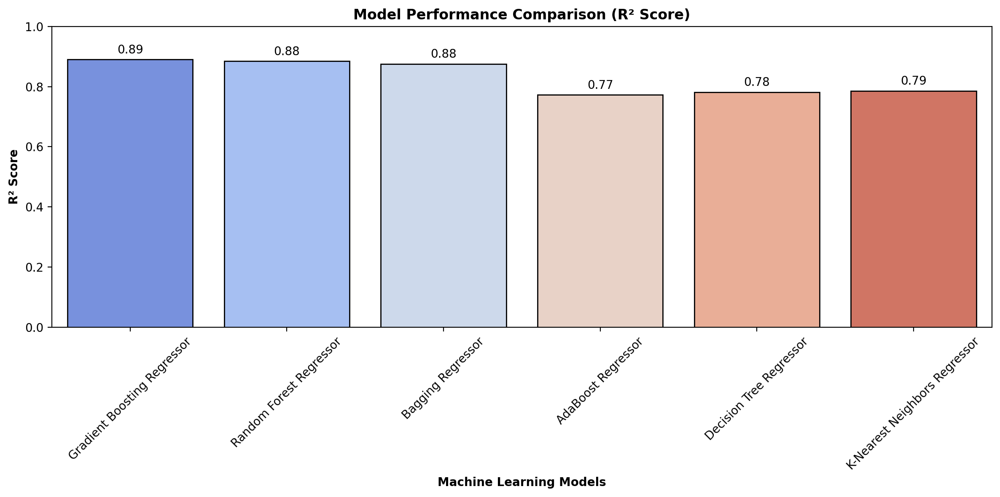

In [4]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.ensemble import (GradientBoostingRegressor,RandomForestRegressor, BaggingRegressor, AdaBoostRegressor)
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# Store regression model results
regression_scores = {}

# Automating Regression Model Training & Evaluation
def regression_prediction(model, model_name):
    # Train the model
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Calculate metrics
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)

    # Display model performance
    print(f"{model_name} Performance:")
    print(f"Mean Absolute Error (MAE): {mae:.2f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
    print(f"R-squared (R²): {r2:.2f}")
    print("-" * 40)

    # Store model performance
    regression_scores[model_name] = {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "R2": r2
    }

# Prepare the data
X = selected_f_df.drop(columns=['Power_Generated'])
y = selected_f_df['Power_Generated']

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

regression_prediction(GradientBoostingRegressor(random_state=42), "Gradient Boosting Regressor")
regression_prediction(RandomForestRegressor(n_estimators=100, random_state=42), "Random Forest Regressor")
regression_prediction(BaggingRegressor(random_state=42), "Bagging Regressor")
regression_prediction(AdaBoostRegressor(random_state=42), "AdaBoost Regressor")
regression_prediction(DecisionTreeRegressor(random_state=42), "Decision Tree Regressor")
regression_prediction(KNeighborsRegressor(), "K-Nearest Neighbors Regressor")

plt.figure(figsize=(12, 6))

# Prepare the values to plot (R² values for comparison)
model_names = list(regression_scores.keys())
r2_values = [scores["R2"] for scores in regression_scores.values()]

# Create barplot with improved aesthetics
ax = sns.barplot(x=model_names,y=r2_values,palette="coolwarm",edgecolor="black")

# Add annotations (text labels for R² values)
for i, value in enumerate(r2_values):ax.text(i, value + 0.02, f"{value:.2f}", ha='center', fontsize=10)

# Customize labels and title
plt.xticks(rotation=45)
plt.ylabel("R² Score", fontweight='bold')
plt.xlabel("Machine Learning Models", fontweight='bold')
plt.title("Model Performance Comparison (R² Score)", fontweight='bold')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

"""# Hyper parameter Tunning"""

from sklearn.model_selection import RandomizedSearchCV
# Define the parameter grids for each model
param_grids = {
      'Gradient Boosting Regressor': {
        'n_estimators': [100, 200, 300, 400],
        'learning_rate': [0.005, 0.01, 0.05, 0.1],
        'max_depth': [3, 5, 7, 10],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'subsample': [0.6, 0.8, 1.0],
        'max_features': ['sqrt', 'log2', None]
    },
    'Random Forest Regressor': {
        'n_estimators': [100, 200, 300, 500],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': ['auto', 'sqrt', 'log2'],
        'bootstrap': [True, False]
    },
    'Bagging Regressor': {
        'n_estimators': [100, 200],
        'max_samples': [0.5, 1.0],
        'max_features': [0.5, 1.0],
        'bootstrap': [True, False]
    },
    'AdaBoost Regressor': {
        'n_estimators': [50, 100],
        'learning_rate': [0.01, 0.1, 0.2]
    },
    'Decision Tree Regressor': {
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2],
        'max_features': ['auto', 'sqrt', 'log2']
    },
    'K-Nearest Neighbors Regressor': {
        'n_neighbors': [3, 5, 10],
        'weights': ['uniform', 'distance'],
        'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
    }
}

models = {
    'Gradient Boosting Regressor': GradientBoostingRegressor(random_state=42),
    'Random Forest Regressor': RandomForestRegressor(random_state=42),
    'Bagging Regressor': BaggingRegressor(random_state=42),
    'AdaBoost Regressor': AdaBoostRegressor(random_state=42),
    'Decision Tree Regressor': DecisionTreeRegressor(random_state=42),
    'K-Nearest Neighbors Regressor': KNeighborsRegressor()
}


In [5]:

def tune_and_evaluate_models(models, param_grids, X_train, X_test, y_train, y_test, cv=5, n_iter=10):
    results = []
    best_models = {}

    for model_name in models:
        print(f"Hyperparameter tuning for {model_name}")
        model = models[model_name]
        param_grid = param_grids[model_name]

        random_search = RandomizedSearchCV(estimator=model,param_distributions=param_grid,n_iter=n_iter,cv=cv,scoring='r2',n_jobs=-1,random_state=42,verbose=1)
        random_search.fit(X_train, y_train)
        best_model = random_search.best_estimator_
        best_models[model_name] = best_model

        # Predict and evaluate
        y_pred = best_model.predict(X_test)
        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_test, y_pred)

        results.append({"Model": model_name,"R2": r2,"MAE": mae,"MSE": mse,"RMSE": rmse})

        print(f"Best parameters for {model_name}: {random_search.best_params_}")
        print(f"R² Score: {r2:.4f}")
        print(f"MAE     : {mae:.4f}")
        print(f"MSE     : {mse:.4f}")
        print(f"RMSE    : {rmse:.4f}")
        print("-" * 40)

    return best_models, results

best_regression_models, results = tune_and_evaluate_models(models,param_grids,X_train,X_test,y_train,y_test,cv=5)
results_df = pd.DataFrame(results)

Hyperparameter tuning for Gradient Boosting Regressor
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters for Gradient Boosting Regressor: {'subsample': 0.8, 'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'log2', 'max_depth': 10, 'learning_rate': 0.05}
R² Score: 0.9003
MAE     : 1598.6280
MSE     : 10497868.8859
RMSE    : 3240.0415
----------------------------------------
Hyperparameter tuning for Random Forest Regressor
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters for Random Forest Regressor: {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': None, 'bootstrap': False}
R² Score: 0.8935
MAE     : 1661.2791
MSE     : 11216031.6091
RMSE    : 3349.0344
----------------------------------------
Hyperparameter tuning for Bagging Regressor
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters for Bagging Regressor: {'n_esti

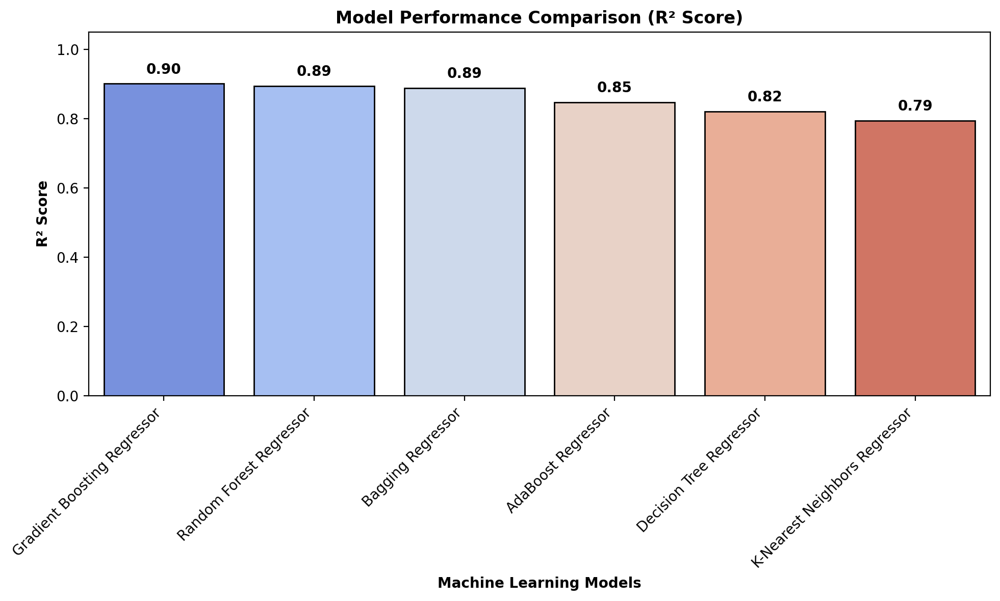

In [7]:
# Sort results by R² score
results_df_sorted = results_df.sort_values(by='R2', ascending=False)

# Create R² barplot
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Model', y='R2', data=results_df_sorted, palette="coolwarm", edgecolor="black")

# Add labels above bars
for i, value in enumerate(results_df_sorted['R2']):
    ax.text(i, value + 0.02, f"{value:.2f}", ha='center', va='bottom', fontsize=10, fontweight='bold')

# Customize plot
plt.xticks(rotation=45, ha='right')
plt.ylabel("R² Score", fontweight='bold')
plt.xlabel("Machine Learning Models", fontweight='bold')
plt.title("Model Performance Comparison (R² Score)", fontweight='bold')
plt.ylim(0, 1.05)
plt.tight_layout()
plt.show()

In [15]:
import joblib



# Access the best Gradient Boosting model from the 'best_regression_models' dictionary
best_gb_model = best_regression_models['Gradient Boosting Regressor']

# Save the best Gradient Boosting model and scaler using joblib


In [29]:
import joblib

# Save the best Gradient Boosting model and the scaler
joblib.dump(best_gb_model, 'Solar_gradient_boosting_model.pkl')

['Solar_gradient_boosting_model.pkl']

In [27]:
joblib.dump(scaler, 'Solar_scaler.pkl')

['Solar_scaler.pkl']